<a href="https://colab.research.google.com/github/RiyaH2020/Explainability_in_Vision_transformers/blob/main/ViT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Explainability in Vision Transformers

## ADA project

## Manami Das (MDS202423)
## Riya Shyam Huddar(MDS202431)

# Vision Transformer Attention Rollout Visualization

**Objective:**  
Explore how the attention mechanism of Vision Transformers (ViTs) highlights image regions.  
We will extract attention matrices, compute **attention rollout**, and visualize which parts of an image the model focuses on.  

**Highlights:**  
- Multiple fusion strategies (Max, Mean, Min)  
- Discarding low-attention connections for interpretability  
- Animation showing how discard ratio affects attention overlays  
- Apply to multiple images for comparison


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

# Visualization Helper
def visualize_rollout(R_matrix, img, title, grid_size=14, alpha=0.6):
    mask_vector = R_matrix[0, 1:]
    mask_vector = mask_vector / mask_vector.max()
    mask_grid = mask_vector.reshape(grid_size, grid_size)
    mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
    mask_img_np = np.array(mask_img)

    plt.imshow(img)
    plt.imshow(mask_img_np, cmap='jet', alpha=alpha)
    plt.axis('off')
    plt.title(title)

# Image Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
])


## Loading the Vision Transformer Model

We use **DeiT Tiny** pretrained on ImageNet.  
Since the default model does not return attention weights, we patch the attention modules to **capture them during forward passes**.


In [ ]:
# Load DeiT Tiny from torch.hub
model = torch.hub.load('facebookresearch/deit:main', 'deit_tiny_patch16_224', pretrained=True)
model.eval()  # Set to evaluation mode

# Function to patch the attention modules
def patch_deit_attention(model, attentions_list):
    """
    Patch all attention blocks of a DeiT model to store attention weights in attentions_list.
    """
    for i in range(len(model.blocks)):
        attn_module = model.blocks[i].attn

        def new_forward(self, x, attn_mask=None, key_padding_mask=None, *args, **kwargs):
            B, N, C = x.shape
            qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
            q, k, v = qkv[0], qkv[1], qkv[2]

            attn = (q @ k.transpose(-2, -1)) * self.scale
            if attn_mask is not None:
                attn = attn + attn_mask
            attn = attn.softmax(dim=-1)

            # Store attention weights
            attentions_list.append(attn.cpu())

            attn = self.attn_drop(attn)
            x_new = (attn @ v).transpose(1, 2).reshape(B, N, C)
            x_new = self.proj(x_new)
            x_new = self.proj_drop(x_new)
            return x_new

        attn_module.forward = new_forward.__get__(attn_module, type(attn_module))

# Prepare attentions list
attentions = []
patch_deit_attention(model, attentions)


Using cache found in /root/.cache/torch/hub/facebookresearch_deit_main


## Attention Rollout

We compute the **relevance of each patch to the CLS token** recursively across layers.  

- **Head fusion**: combine attention heads using max, mean, or min  
- **Discard ratio**: remove low-attention connections to highlight the most important regions


In [ ]:
def attention_rollout_advanced(attentions, head_fusion="max", discard_ratio=0.0):
    """
    Compute the attention rollout matrix from a list of attention tensors.

    Parameters:
        attentions (list of torch.Tensor): List of attention matrices (from each layer)
        head_fusion (str): 'max', 'mean', or 'min' to fuse heads
        discard_ratio (float): Fraction of lowest attention scores to discard (0.0-0.9)

    Returns:
        np.ndarray: Final rollout matrix (relevance of each patch to CLS token)
    """
    attentions = torch.cat(attentions, dim=0)  # Shape: [L, H, S, S]

    # Fuse heads
    if head_fusion == "max":
        attention_heads_fused = attentions.max(dim=1)[0]
    elif head_fusion == "mean":
        attention_heads_fused = attentions.mean(dim=1)
    elif head_fusion == "min":
        attention_heads_fused = attentions.min(dim=1)[0]
    else:
        raise ValueError(f"Unknown fusion method: {head_fusion}")

    # Add identity for residual connection
    I = torch.eye(attention_heads_fused.shape[-1]).to(attentions.device)
    A_prime = attention_heads_fused + I
    A_prime = torch.clamp(A_prime, min=0.0)

    # Apply discard ratio
    if discard_ratio > 0.0:
        flat = A_prime[:, 1:].view(A_prime.size(0), -1)
        keep_fraction = 1.0 - discard_ratio
        k = max(1, int(flat.size(-1) * keep_fraction))
        thresholds = flat.topk(k, dim=-1, largest=True)[0].min(dim=-1)[0].unsqueeze(-1).unsqueeze(-1)
        A_prime = A_prime.masked_fill(A_prime < thresholds, 0.0)

    # Normalize rows
    A_prime = A_prime / A_prime.sum(dim=-1, keepdim=True)

    # Recursive rollout
    R = A_prime[0]
    for i in range(1, len(A_prime)):
        R = torch.matmul(A_prime[i], R)

    return R.cpu().numpy()


## Comparing Attention Rollout: Max, Mean, and Min Fusion

Vision Transformers have multiple attention heads. Different fusion strategies can highlight different aspects of the image:

- **Max Fusion**: Highlights the strongest connection across heads (sharpest attention).  
- **Mean Fusion**: Averages all heads, giving smoother and more global attention.  
- **Min Fusion**: Highlights consistently weak connections across heads (often noisy).  

We visualize the attention rollout for all three fusion types on the same image to compare their effect.


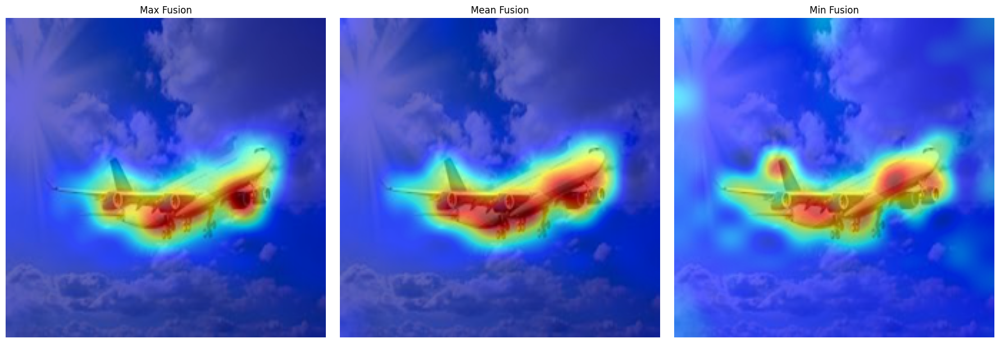

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Clear previous attentions
attentions.clear()

# Forward pass for the image
img_path = "/content/drive/MyDrive/ADA project/airliner.png"
img = Image.open(img_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0)

with torch.no_grad():
    model(input_tensor)

# Compute rollouts
R_max = attention_rollout_advanced(attentions, head_fusion="max", discard_ratio=0.9)
R_mean = attention_rollout_advanced(attentions, head_fusion="mean", discard_ratio=0.9)
R_min = attention_rollout_advanced(attentions, head_fusion="min", discard_ratio=0.9)

# Helper to visualize
def visualize_rollout(R_matrix, img, title, grid_size=14):
    mask_vector = R_matrix[0, 1:]  # CLS to patch tokens
    mask_vector = mask_vector / mask_vector.max()
    mask_grid = mask_vector.reshape(grid_size, grid_size)
    mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
    mask_img_np = np.array(mask_img)

    plt.imshow(img)
    plt.imshow(mask_img_np, cmap='jet', alpha=0.6)
    plt.axis('off')
    plt.title(title)

# Plot all three
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
visualize_rollout(R_max, img, "Max Fusion")
plt.subplot(1,3,2)
visualize_rollout(R_mean, img, "Mean Fusion")
plt.subplot(1,3,3)
visualize_rollout(R_min, img, "Min Fusion")
plt.tight_layout()
plt.show()


## Animation: Effect of Discard Ratio on Attention Rollout

We will vary the discard ratio from 0.0 to 0.9 and generate an overlay animation to see how the model focuses on the most important image regions.  
This helps interpret the Vision Transformer's attention behavior.


In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML

def animate_attention_rollout(model, img_path, discard_ratios=np.linspace(0, 0.9, 10), head_fusion="max"):
    """
    Generate an animation showing attention overlays for varying discard ratios.

    Parameters:
        model: Patched DeiT model
        img_path (str): Path to input image
        discard_ratios (list or np.ndarray): Values from 0.0 to 0.9
        head_fusion (str): 'max', 'mean', or 'min'
    """
    # Load and preprocess image
    img = Image.open(img_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0)

    # Clear previous attentions
    attentions.clear()

    # Forward pass
    with torch.no_grad():
        model(input_tensor)

    # Prepare figure
    fig, ax = plt.subplots(figsize=(6,6))
    ax.axis('off')

    # Generate each frame
    ims = []
    for ratio in discard_ratios:
        R = attention_rollout_advanced(attentions, head_fusion=head_fusion, discard_ratio=ratio)
        mask_vector = R[0,1:] / R[0,1:].max()
        mask_grid = mask_vector.reshape(14,14)
        mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
        mask_img_np = np.array(mask_img)

        im = ax.imshow(img)
        overlay = ax.imshow(mask_img_np, cmap='jet', alpha=0.6)
        title = ax.set_title(f"Varying Discard Ratio", fontsize=12)
        ims.append([im, overlay, title])

    # Create animation
    ani = animation.ArtistAnimation(fig, ims, interval=800, blit=True, repeat_delay=1000)
    plt.close(fig)
    return HTML(ani.to_jshtml())

# Example Usage
# animate_attention_rollout(model, "plane.png", discard_ratios=np.linspace(0,0.9,10), head_fusion="max")


In [ ]:
animate_attention_rollout(model, "/content/drive/MyDrive/ADA project/airliner.png", discard_ratios=np.linspace(0,0.9,10), head_fusion="mean")


In [ ]:
def animate_attention_rollout_gif(model, img_path, discard_ratios=np.linspace(0,0.9,10),
                                  head_fusion="mean", save_path="attention_rollout.gif"):
    """
    Generate a looping GIF showing attention overlays for varying discard ratios using PillowWriter.
    """
    from PIL import Image
    from matplotlib.animation import PillowWriter

    # Load and preprocess image
    img = Image.open(img_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0)

    # Clear previous attentions
    attentions.clear()

    # Forward pass
    with torch.no_grad():
        model(input_tensor)

    # Prepare figure
    fig, ax = plt.subplots(figsize=(6,6))
    ax.axis('off')

    ims = []
    for ratio in discard_ratios:
        R = attention_rollout_advanced(attentions, head_fusion=head_fusion, discard_ratio=ratio)
        mask_vector = R[0,1:] / R[0,1:].max()
        mask_grid = mask_vector.reshape(14,14)
        mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
        mask_img_np = np.array(mask_img)

        im = ax.imshow(img)
        overlay = ax.imshow(mask_img_np, cmap='jet', alpha=0.6)
        title = ax.set_title(f"Discard Ratio variation", fontsize=12)
        ims.append([im, overlay, title])

    # Create animation with PillowWriter
    ani = animation.ArtistAnimation(fig, ims, interval=800, blit=True, repeat_delay=10)
    ani.save(save_path, writer=PillowWriter(fps=1))
    plt.close(fig)
    print(f"GIF saved to {save_path}")

    return Image.open(save_path)


GIF saved to attention_rollout.gif


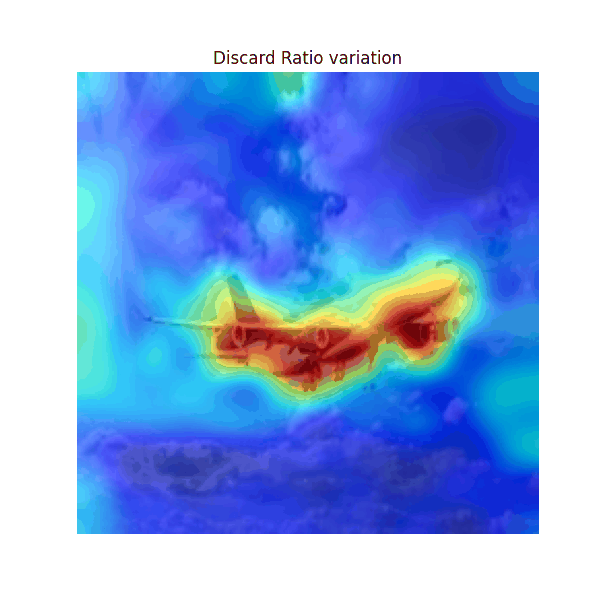

In [ ]:
animate_attention_rollout_gif(model, "/content/drive/MyDrive/ADA project/airliner.png", discard_ratios=np.linspace(0,0.9,10),
                                  head_fusion="mean", save_path="attention_rollout.gif")

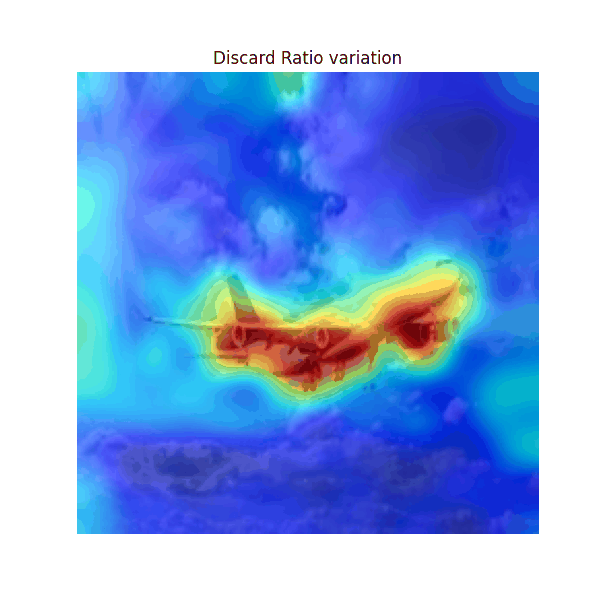

In [ ]:
from IPython.display import Image, display

# Display the saved GIF inline properly
display(Image(filename="attention_rollout.gif"))


## Attention Rollout Across Multiple Images

Below, we visualize the attention rollout for **/Images`** using a selected head fusion strategy and discard ratio.  
This grid gives a broad view of how the Vision Transformer focuses on different objects.


In [ ]:
import torch
import requests

# Load ImageNet classes only once
IMAGENET_URL = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = requests.get(IMAGENET_URL).text.splitlines()

def get_predicted_class(model, img, transform):
    """
    Returns the predicted ImageNet class name for a PIL image.
    """
    input_tensor = transform(img).unsqueeze(0)

    with torch.no_grad():
        output = model(input_tensor)
        probs = torch.nn.functional.softmax(output, dim=-1)
        class_idx = torch.argmax(probs).item()

    return imagenet_classes[class_idx]


In [ ]:
import os
import re

def extract_original_name(img_path):
    """
    Extracts original label from filenames like
    Also removes multiple extensions like .jpeg.jpg.png
    """
    filename = os.path.basename(img_path)

    # Remove ALL trailing .xxx extensions
    filename = re.sub(r'(\.[a-zA-Z0-9]+)+$', '', filename)

    # Split at first underscore
    parts = filename.split("_", 1)

    if len(parts) == 1:
        return filename  # no underscore case
    else:
        label = parts[1]

    # Replace underscores with spaces
    label = label.replace("_", " ")

    return label.strip()


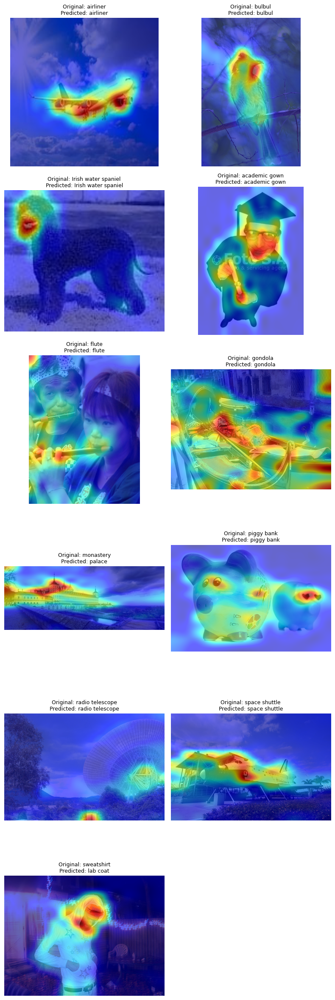

In [ ]:
import glob
import os
import re
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# --- Parameters ---
fusion = "max"          # 'max', 'mean', or 'min'
discard = 0.9           # discard ratio to focus attention
grid_cols = 2           # number of columns in grid

# --- Load images ---
img_paths = sorted(glob.glob("/content/drive/MyDrive/ADA project/*"))
imgs = [Image.open(p).convert("RGB") for p in img_paths]

# --- Compute attention rollout for each image ---
rollouts = []
for img_path, img in zip(img_paths, imgs):
    # Preprocess
    input_tensor = transform(img).unsqueeze(0)
    attentions.clear()

    # Forward pass
    with torch.no_grad():
        model(input_tensor)

    # Attention rollout
    R = attention_rollout_advanced(attentions, head_fusion=fusion, discard_ratio=discard)
    rollouts.append(R)

# --- Plot grid ---
n = len(imgs)
rows = (n + grid_cols - 1) // grid_cols
plt.figure(figsize=(grid_cols * 4, rows * 4))

for idx, (img_path, img, R) in enumerate(zip(img_paths, imgs, rollouts)):
    plt.subplot(rows, grid_cols, idx + 1)

    # Convert rollout vector to mask
    mask_vec = R[0, 1:] / R[0, 1:].max()
    grid_size = int(np.sqrt(mask_vec.shape[0]))
    mask_grid = mask_vec.reshape(grid_size, grid_size)

    mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
    mask_np = np.array(mask_img)

    # Get predicted + original class names
    pred_class = get_predicted_class(model, img, transform)
    original_name = extract_original_name(img_path)

    # Overlay heatmap
    plt.imshow(img)
    plt.imshow(mask_np, cmap='jet', alpha=0.6)
    plt.axis('off')

    # Title: Original and Predicted
    plt.title(f"Original: {original_name}\nPredicted: {pred_class}", fontsize=9)

plt.tight_layout()
plt.show()


### Probing Model Reliance via Attention Rollout

**Objective:**  
To investigate whether the Vision Transformer (ViT) relies on the actual object features or co-occurring cues in the dataset when making predictions.  

**Experiment:**  
We passed an image of a Black woman wearing an academic gown through the pretrained DeiT model. While the model correctly predicted the class as **“academic gown”**, we used **attention rollout** to inspect where the model focuses its attention when forming the prediction.  

**Methodology:**  
- The image is processed through the patched ViT model, which records attention weights at each layer.  
- Using the **attention rollout** method, we aggregate attention across layers to compute a relevance map of all image patches with respect to the CLS token.  
- This map highlights regions that the model considers most informative for its prediction.  

**Observation:**  
- The attention rollout reveals that the model focuses primarily on the **face** rather than the gown itself.  
- Despite predicting correctly, this indicates the model may be leveraging **co-occurring features** (faces) as shortcuts rather than learning a robust representation of the gown.  

**Explanation and Validity:**  
- Attention rollout provides a **mechanistic probe** of ViTs, showing which input tokens most influence the CLS token and final classification.  
- This is a valid explainability approach, commonly used in research to understand **model decision pathways** ([Abnar & Zuidema, 2020](https://arxiv.org/abs/2005.00928)).  
- By systematically examining where the model attends, we can identify **potential biases or shortcut learning** in datasets.  

**Broader Implications:**  
- This technique is **model-agnostic**: attention rollouts or similar attribution methods can be applied to other transformer-based architectures or attention-enabled networks.  
- It provides a **tool for explainable AI**, allowing researchers and practitioners to:  
  1. Confirm whether predictions are based on relevant features.  
  2. Identify spurious correlations that could affect generalization.  
  3. Compare behavior across different models or datasets for fairness and robustness analysis.  

**Conclusion:**  
Even with correct classification, attention rollouts reveal **non-intuitive reliance on correlated but irrelevant features**, highlighting how explainability techniques can uncover **hidden decision patterns** in deep models.


In [ ]:
from torchvision import transforms
import torch
from PIL import Image

# Load image
img_path = "/content/drive/MyDrive/black_woman_academic_gown.jpg"
img = Image.open(img_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0)  # Using your earlier transform

# Clear previous attentions
attentions.clear()

# Forward pass
with torch.no_grad():
    output = model(input_tensor)
    probs = torch.nn.functional.softmax(output, dim=-1)
    class_idx = torch.argmax(probs).item()

# Map to ImageNet class name
import json, requests

# Download ImageNet class index if you haven't
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = requests.get(url).text.splitlines()

print("Predicted class:", imagenet_classes[class_idx])


Predicted class: academic gown


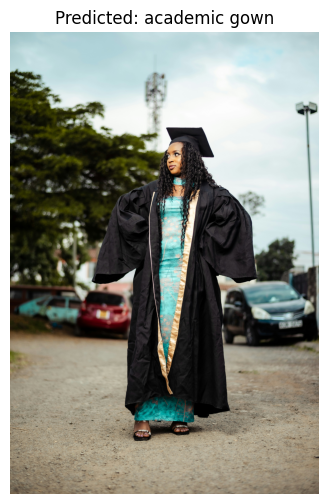

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Visualize image
plt.figure(figsize=(6,6))
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {imagenet_classes[class_idx]}")
plt.show()


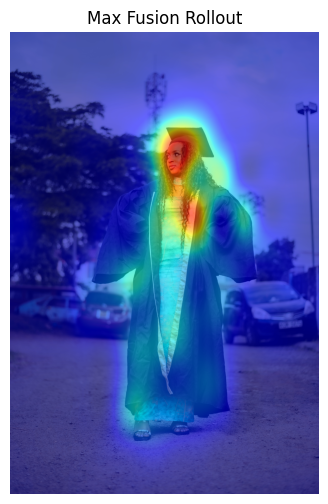

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torch

# --- 1. Load new image ---
new_img_path = "/content/drive/MyDrive/black_woman_academic_gown.jpg"
img = Image.open(new_img_path).convert("RGB")
input_tensor = transform(img).unsqueeze(0)

# --- 2. Clear previous attentions ---
attentions.clear()

# --- 3. Forward pass (with torch.no_grad since no gradient needed) ---
with torch.no_grad():
    model(input_tensor)

# --- 4. Compute rollout (max fusion only) ---
R_max = attention_rollout_advanced(attentions, head_fusion="max", discard_ratio=0.9)

# --- 5. Visualize rollout ---
def visualize_rollout_max(R_matrix, img, grid_size=14):
    mask_vector = R_matrix[0, 1:]  # CLS to patch tokens
    mask_vector = mask_vector / mask_vector.max()
    mask_grid = mask_vector.reshape(grid_size, grid_size)
    mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
    mask_img_np = np.array(mask_img)

    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.imshow(mask_img_np, cmap='jet', alpha=0.6)
    plt.axis('off')
    plt.title("Max Fusion Rollout")
    plt.show()

visualize_rollout_max(R_max, img)


## Quantitative Evaluation: Attention Rollout Focus on Foreground vs Background

To complement our qualitative visualizations of attention rollout, we perform a **quantitative analysis** to measure where the model focuses in an image.

### Methodology

1. **Foreground Mask (Object of Interest):**
   - Detected automatically using a pretrained **Mask R-CNN** model (COCO weights).  
   - All detected objects in the image are combined into a single **foreground mask**.  
   - This avoids manual labeling and works across arbitrary ImageNet images (animals, people, buildings, etc.).

2. **Background Mask:**
   - Defined as the complement of the foreground mask.

3. **Attention Fraction Metrics:**
   Using the 14×14 attention rollout grid from the Vision Transformer:

   - **Foreground Attention Fraction (FAF):**
     $$
     FAF = \frac{\sum (\text{attention} \times \text{foreground mask})}{\sum \text{attention}}
     $$

   - **Background Attention Fraction (BAF):**
     $$
     BAF = \frac{\sum (\text{attention} \times \text{background mask})}{\sum \text{attention}}
     $$

   - By construction: $FAF + BAF = 1$

4. **Purpose:**
   - Provides a numeric, reproducible measure of whether the model focuses on relevant regions of the image.  
   - Can compare across multiple images, different attention fusion strategies (Max/Mean/Min), and later gradient rollout.

### Advantages
- Works for **diverse ImageNet images** (birds, buildings, animals, people, etc.) without manual masks.  
- Provides a **benchmarkable metric** for explainability.  
- Allows **easy visualization** as bar plots for multiple images to highlight trends or biases.


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


100%|██████████| 170M/170M [00:01<00:00, 102MB/s] 


                                 image  foreground_frac  background_frac
0                         airliner.png         0.109134         0.890866
1             n03781244_monastery.jpeg         0.011610         0.988390
2   n02102973_Irish_water_spaniel.jpeg         0.481439         0.518561
3       n04044716_radio_telescope.jpeg         0.293874         0.706126
4               n03447447_gondola.jpeg         0.542860         0.457140
5         n04266014_space_shuttle.jpeg         0.241469         0.758531
6                 n03372029_flute.jpeg         0.922154         0.077846
7                n01560419_bulbul.jpeg         0.193461         0.806539
8            n04370456_sweatshirt.jpeg         0.447882         0.552119
9            n03935335_piggy_bank.jpeg         0.466558         0.533442
10        n02669723_academic_gown.jpeg         0.496609         0.503391


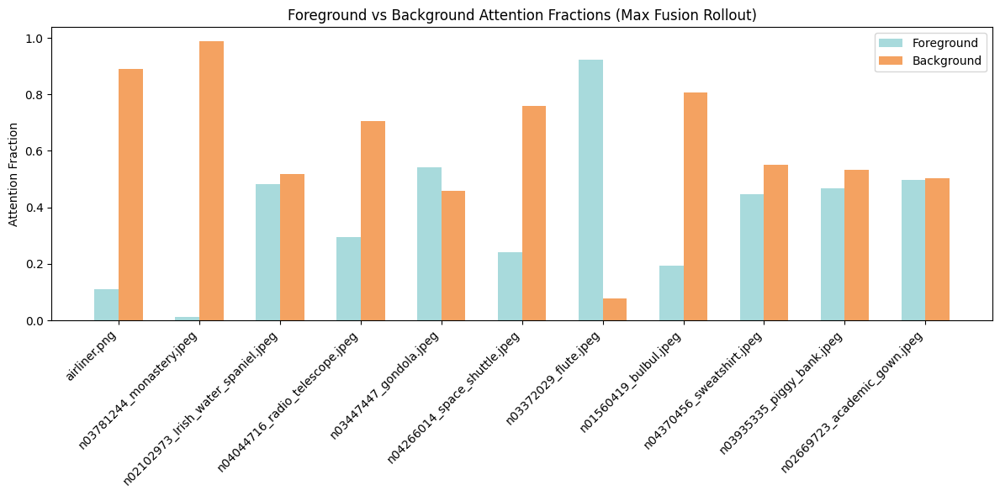

In [ ]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

# Pretrained Mask R-CNN for foreground masks
mask_model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")
mask_model.eval()

def compute_foreground_mask(img, threshold=0.5):
    """Return binary foreground mask (1=object, 0=background)"""
    transform_mrcnn = transforms.Compose([transforms.ToTensor()])
    input_tensor = transform_mrcnn(img).unsqueeze(0)

    with torch.no_grad():
        outputs = mask_model(input_tensor)

    masks = outputs[0]['masks']  # [N,1,H,W]
    if len(masks) == 0:
        return np.zeros((img.height, img.width), dtype=np.uint8)

    # Combine all detected object masks
    combined_mask = (masks > threshold).any(dim=0).squeeze().cpu().numpy().astype(np.uint8)
    return combined_mask

def compute_attention_fractions(R_matrix, mask_img, grid_size=14):
    """Compute foreground/background attention fractions"""
    attn_vector = R_matrix[0,1:]
    attn_vector = attn_vector / attn_vector.sum()  # Normalize

    mask_grid = np.array(Image.fromarray(mask_img).resize((grid_size, grid_size), Image.Resampling.NEAREST))

    foreground_frac = attn_vector[mask_grid.flatten() == 1].sum()
    background_frac = attn_vector[mask_grid.flatten() == 0].sum()

    return foreground_frac, background_frac

# Folder containing images
image_folder = "/content/drive/MyDrive/ADA project/"
image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.lower().endswith((".jpeg",".png"))]

results = []
for img_path in image_paths:
    img = Image.open(img_path).convert("RGB")

    # Run attention rollout
    attentions.clear()
    with torch.no_grad():
        input_tensor = transform(img).unsqueeze(0)
        model(input_tensor)
    R = attention_rollout_advanced(attentions, head_fusion="max", discard_ratio=0.0)

    # Compute foreground mask
    fg_mask = compute_foreground_mask(img)

    # Compute FAF/BAF
    fg_frac, bg_frac = compute_attention_fractions(R, fg_mask)

    results.append({
        "image": os.path.basename(img_path),
        "foreground_frac": fg_frac,
        "background_frac": bg_frac
    })

# Convert to DataFrame
df_results = pd.DataFrame(results)
print(df_results)

# --- Bar plot visualization with pastel colors ---
plt.figure(figsize=(12,6))
x = np.arange(len(df_results))

plt.bar(x-0.15, df_results["foreground_frac"], width=0.3, label="Foreground", color="#a8dadc")  # pastel teal
plt.bar(x+0.15, df_results["background_frac"], width=0.3, label="Background", color="#f4a261")  # pastel coral

plt.xticks(x, df_results["image"], rotation=45, ha='right')
plt.ylabel("Attention Fraction")
plt.title("Foreground vs Background Attention Fractions (Max Fusion Rollout)")
plt.legend()
plt.tight_layout()
plt.show()



### Caveat on Attention Fractions

Foreground vs. background attention fractions provide a quantitative glimpse of where the model focuses, but **automatic masks may not align with the true object of interest**. For instance, in an image of a person playing a flute, detected foreground may be the hand, even if the flute or the musical activity is the class-defining feature.  

Because our goal is to analyze **generic ImageNet-trained ViT models** over a diverse set of images, creating **tailored or dynamic masks for every class** would be extremely time-consuming and require manual annotation. This is why we rely on generic foreground masks—even if imperfect—for a **first-pass, reproducible quantitative analysis**.  

**Takeaway:** This metric is indicative but not fully reliable—class-specific or dynamic masking could improve evaluation, but at the cost of manual effort or additional datasets.


-----

# Vision Transformer Gradient Rollout



### What is Gradient Attention Rollout?

Gradient Attention Rollout is a technique for explaining predictions made by a vision transformer (ViT) model that combines **attention weights** with **class-specific gradient information**. Instead of using raw attention alone—which may not indicate what really drove the decision—this method weights the attention flows by how much they contribute to the target class, thereby producing a map of which patches the model *used* (and how strongly) for that class.

---

### Why it’s needed

* Attention weights alone in a transformer only tell where tokens are *looking*, not *what information* they passed or how that influenced the prediction.
* The Chefer et al. paper shows that pure attention-based maps fail to properly handle skip-connections and the propagation of relevance through layers.
* Gradient Attention Rollout incorporates **gradients** of the output with respect to attention or token states, making it *class-specific* and thus more meaningful for explanations.

---

### How it works

1. For each attention layer in the transformer, obtain the attention matrix (showing token → token influence).
2. Compute the gradient of the target class output with respect to each attention matrix or token embedding (to see how importantly each connection contributed to that class).
3. Fuse the attention heads (e.g., by max, mean, or discarding weak heads) so you get a single matrix per layer.
4. Multiply or weight each attention matrix by its associated gradient importance, so you get a “gradient-weighted” attention matrix.
5. Recursively **roll out** (multiply) these layer-wise matrices from the class token back to the input patches — this gives a final relevance map for each patch.
6. Map the patch relevance values back to image space and visualize as a heatmap.

---

### Key advantages

* **Class-specific**: By using gradients tied to a particular class, the explanation focuses on what the model used *for that class*.
* **Token-aware**: Takes into account the transformer’s patch/token structure rather than assuming spatial grids like CNNs.
* **Layer-propagated**: Captures the flow of relevance across multiple attention layers and skip-connections, not just one snapshot.

---

### Caveats

* The method still relies on attention matrices and assumes that information propagation happens in a linear or multiplicative way.
* The granularity is limited to *patches* rather than individual pixels, due to the ViT’s token structure.
* Some studies report that these maps may still be **less localized** or sharp compared to CNN-based methods like Grad-CAM when applied to ViTs.



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------
# 1. Load DeiT Model (Fresh Instance)
# ------------------------------------------------------------
# Loading the DeiT-Tiny model from Torch Hub.
# Using eval() ensures the model runs in inference mode.
model = torch.hub.load(
    'facebookresearch/deit:main',
    'deit_tiny_patch16_224',
    pretrained=True
)
model.eval()

# ------------------------------------------------------------
# 2. Image Path and Model Input Settings
# ------------------------------------------------------------
image_path = '/content/drive/MyDrive/ADA project/airliner.png'
model_size = 224

# ImageNet normalization values required by DeiT
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# ------------------------------------------------------------
# 3. Load and Preprocess the Image
# ------------------------------------------------------------
# Open the image, ensure 3-channel RGB, resize to model input size.
try:
    img = Image.open(image_path).convert('RGB').resize((model_size, model_size))
except FileNotFoundError:
    print(f"ERROR: Image file '{image_path}' not found.")
    raise

# Define preprocessing transformations:
# - Resize image
# - Convert to tensor
# - Normalize using ImageNet statistics
transform = transforms.Compose([
    transforms.Resize((model_size, model_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# Apply transformations and add batch dimension
input_tensor = transform(img).unsqueeze(0)

# Enable gradient computation on the input image.
# Required for saliency, gradient rollout, and similar techniques.
input_tensor.requires_grad = True

print("Model loaded and input tensor prepared.")


Model loaded and input tensor prepared.


Using cache found in /root/.cache/torch/hub/facebookresearch_deit_main



### **Short Explanation**

This code loads a **DeiT-Tiny Vision Transformer**, prepares an input image, and applies the required preprocessing so the model can make a prediction. The image is resized, converted to a tensor, normalized with ImageNet statistics, and a batch dimension is added. `input_tensor.requires_grad = True` is enabled so later steps (like Grad-Rollout or saliency maps) can compute gradients with respect to the input.



In [ ]:
# ------------------------------------------------------------
# 2. Patch Attention Modules for Gradient Rollout
# ------------------------------------------------------------
# Global lists to store attention maps (A) and their gradients (G)
attentions_maps_grad = []
attentions_grad = []

# Iterate through each transformer block in the model
for i in range(len(model.blocks)):
    attn_module = model.blocks[i].attn

    # Custom forward function for capturing attention maps and gradients
    def forward_with_grad(self, x, attn_mask=None, key_padding_mask=None, *args, **kwargs):
        B, N, C = x.shape

        # Compute QKV
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, C // self.num_heads)
        qkv = qkv.permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]

        # Compute scaled dot-product attention
        attn = (q @ k.transpose(-2, -1)) * self.scale
        if attn_mask is not None:
            attn = attn + attn_mask
        attn = attn.softmax(dim=-1)

        # Save attention map
        attentions_maps_grad.append(attn)

        # Register backward hook to save gradient
        attn.register_hook(lambda grad: attentions_grad.append(grad))

        # Compute output
        attn = self.attn_drop(attn)
        x_new = (attn @ v).transpose(1, 2).reshape(B, N, C)
        x_new = self.proj(x_new)
        x_new = self.proj_drop(x_new)

        return x_new

    # Patch the attention module's forward method
    attn_module.forward = forward_with_grad.__get__(attn_module, type(attn_module))

print("Model attention modules patched to capture forward and backward attention data.")


Model attention modules patched to capture forward and backward attention data.



This code modifies each Vision Transformer attention layer so that, during the forward pass, it saves the **attention maps**, and during the backward pass, it captures their **gradients**. These two pieces — attention (A) and gradients (G) — are required to compute **Gradient Attention Rollout**, which gives class-specific explanation maps. The model’s original forward function is replaced (patched) with a custom version that records this information.



In [ ]:
# ------------------------------------------------------------
# 3. Forward and Backward Pass
# ------------------------------------------------------------

# 1. Set model to train mode to enable gradient accumulation
model.train()

# Clear previous attention maps and gradients
attentions_maps_grad.clear()
attentions_grad.clear()

# 2. Forward pass (track gradients)
with torch.enable_grad():
    output = model(input_tensor)

# 3. Get the predicted class index
pred_idx = output.argmax(dim=-1).item()
print(f"Predicted Class Index: {pred_idx}")

# 4. Backward pass to compute gradients w.r.t. predicted class
target_score = output[0, pred_idx]
model.zero_grad()
target_score.backward()

print("Forward and backward passes complete. Attention gradients extracted.")


Predicted Class Index: 404
Forward and backward passes complete. Attention gradients extracted.



This block runs a forward and backward pass to capture the attention maps and their gradients. The model is put in training mode so gradients can flow, then a forward pass computes the output and identifies the predicted class. A backward pass is performed on that class score, which generates the gradients needed for Gradient Attention Rollout. During these passes, all attention maps (A) and their gradients (G) are collected for explanation.



In [ ]:
def gradient_attention_rollout(att_maps, att_grads, head_fusion="max", discard=None):
    """
    Compute a robust gradient attention rollout mask for a ViT model,
    optionally discarding the lowest attention values.

    Args:
        att_maps (list[Tensor]): Attention maps from forward pass
        att_grads (list[Tensor]): Gradients of attention maps from backward pass
        head_fusion (str): Method to fuse attention heads ('max', 'mean', 'min')
        discard (float, optional): Fraction of lowest attention values to discard (0-1).
                                   If None, no discarding is applied.

    Returns:
        mask (np.ndarray): Relevance scores for each input patch
    """

    # Reverse gradients to match forward order
    att_grads = att_grads[::-1]

    A_star_list = []
    for A, G in zip(att_maps, att_grads):
        # Weighted attention
        A_star = torch.relu(G) * A

        # Fuse attention heads
        if head_fusion == "max":
            A_star_fused = A_star.max(dim=1)[0]
        elif head_fusion == "mean":
            A_star_fused = A_star.mean(dim=1)
        elif head_fusion == "min":
            A_star_fused = A_star.min(dim=1)[0]
        else:
            raise ValueError(f"Invalid head_fusion method: {head_fusion}")

        # Apply discard threshold if specified
        if discard is not None:
            threshold = torch.quantile(A_star_fused, discard)
            A_star_fused = torch.where(A_star_fused >= threshold, A_star_fused, torch.zeros_like(A_star_fused))

        # Add identity for residual connection
        I = torch.eye(A_star_fused.shape[-1], device=A_star_fused.device)
        A_star_prime = A_star_fused + I

        # Normalize rows
        A_star_norm = A_star_prime / A_star_prime.sum(dim=-1, keepdim=True)
        A_star_list.append(A_star_norm)

    # Recursive rollout
    R_star = A_star_list[0]
    for i in range(1, len(A_star_list)):
        R_star = torch.matmul(A_star_list[i], R_star)

    # Extract relevance for input patches (exclude CLS token)
    mask = R_star[0, 0, 1:].clamp(min=0).detach().cpu().numpy()

    return mask

grad_mask_vector = gradient_attention_rollout(attentions_maps_grad, attentions_grad, head_fusion="max")



This function computes **Gradient Attention Rollout**, which combines attention maps with their gradients to produce a class-specific relevance map for ViT patches. For each layer, it multiplies attention by positive gradients (importance), fuses attention heads, optionally removes weak values, adds identity for residuals, normalizes rows, and then recursively multiplies all layers to trace relevance from the CLS token back to the input patches. The final output is a 1D mask showing **how important each image patch was for the predicted class**.

**“It produces a class-specific patch-importance map by combining attention with gradients and rolling it through transformer layers.”**


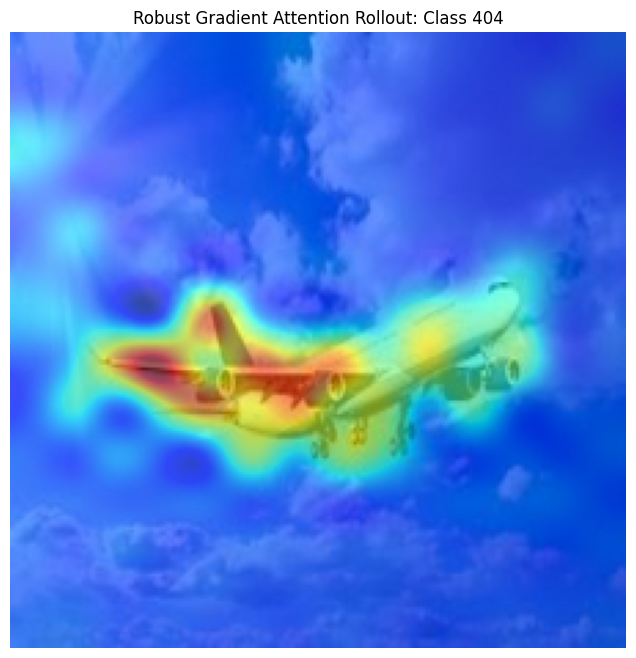

In [ ]:
def visualize_mask_vector(mask_vector, img, title, grid_size=14, alpha=0.6):
    """
    Overlay a gradient attention rollout mask on the original image.

    Args:
        mask_vector (np.ndarray): 1D vector of relevance scores per patch
        img (PIL.Image): Original input image
        title (str): Title for the plot
        grid_size (int): Number of patches along width/height (default 14)
        alpha (float): Transparency of overlay (0=transparent, 1=opaque)
    """

    # Normalize mask to [0,1]
    mask_vector = mask_vector / mask_vector.max()

    # Reshape to 2D grid
    mask_grid = mask_vector.reshape(grid_size, grid_size)

    # Resize mask to match image dimensions
    mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
    mask_img_np = np.array(mask_img)

    # Plot original image with overlay
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.imshow(mask_img_np, cmap='jet', alpha=alpha)
    plt.axis('off')
    plt.title(title)
    plt.show()


# Visualize gradient attention rollout on the image
visualize_mask_vector(
    grad_mask_vector,
    img,
    title=f"Robust Gradient Attention Rollout: Class {pred_idx}",
    grid_size=14,
    alpha=0.6
)




This function visualizes the Gradient Attention Rollout results by turning the 1D patch-relevance vector into a 2D heatmap and overlaying it on the original image. It reshapes the relevance scores into a 14×14 patch grid, rescales it to the full image size, and applies a colored “jet” heatmap with transparency. The final plot shows **which regions of the image the ViT considered most important** for the predicted class.



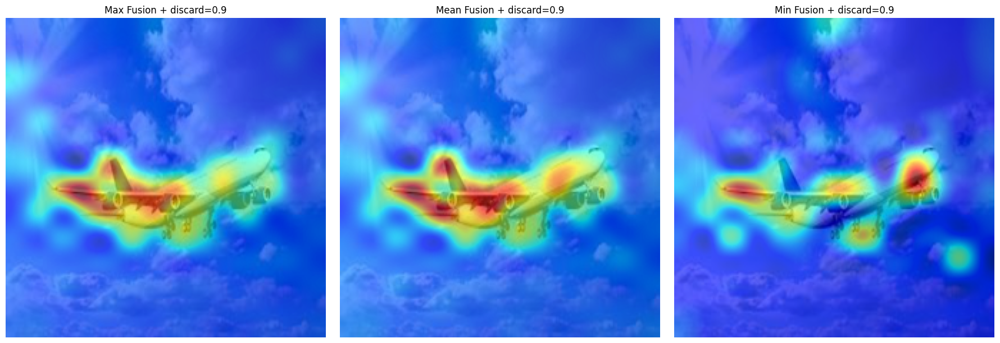

In [ ]:
# Define fusion methods
fusion_methods = ["max", "mean", "min"]
discard_ratio = 0.9  # Keep top 10% of attention values

# Create a figure with 1 row x 3 columns
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, fusion in enumerate(fusion_methods):
    # Compute gradient attention rollout mask with discard
    mask_vector = gradient_attention_rollout(
        att_maps=attentions_maps_grad,
        att_grads=attentions_grad,
        head_fusion=fusion,
        discard=discard_ratio
    )

    # Normalize and reshape for visualization
    mask_vector = mask_vector / mask_vector.max()
    mask_grid = mask_vector.reshape(14, 14)
    mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
    mask_img_np = np.array(mask_img)

    # Overlay on original image
    axes[i].imshow(img)
    axes[i].imshow(mask_img_np, cmap='jet', alpha=0.6)
    axes[i].axis('off')
    axes[i].set_title(f"{fusion.capitalize()} Fusion + discard={discard_ratio}")

plt.tight_layout()
plt.show()




This code compares three different ways of fusing attention heads—**max**, **mean**, and **min**—while keeping only the **top 10% most important attention values** (discarding weak ones). For each fusion method, it computes a Gradient Attention Rollout mask, converts it into a heatmap, overlays it on the original image, and displays all three results side-by-side. This shows how different head-fusion choices affect the sharpness and focus of the explanation.




In [ ]:
import imageio
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def generate_grad_discard_gif(att_maps, att_grads, img, fusion="max", grid_size=14, alpha=0.6,
                         discard_steps=4, save_path="/content/grad_attention_discard.gif"):
    """
    Generate a GIF showing how gradient attention rollout changes as discard ratio increases.

    Args:
        att_maps (list[Tensor]): Attention maps from forward pass
        att_grads (list[Tensor]): Gradients from backward pass
        img (PIL.Image): Original input image
        fusion (str): 'max', 'mean', 'min'
        grid_size (int): Patch grid size (default 14)
        alpha (float): Transparency for overlay
        discard_steps (int or list): Number of steps or list of discard ratios
        save_path (str): Path to save GIF
    """

    # Create discard ratios
    if isinstance(discard_steps, int):
        discard_ratios = np.linspace(0.0, 0.9, discard_steps)
    else:
        discard_ratios = discard_steps

    frames = []

    for discard in discard_ratios:
        # Compute mask
        mask_vector = gradient_attention_rollout(att_maps, att_grads, head_fusion=fusion, discard=discard)
        mask_vector = mask_vector / mask_vector.max()
        mask_grid = mask_vector.reshape(grid_size, grid_size)

        # Resize mask to image
        mask_img = Image.fromarray((mask_grid * 255).astype(np.uint8)).resize(img.size, Image.Resampling.LANCZOS)
        mask_img_np = np.array(mask_img)

        # Overlay heatmap on original image
        overlay = np.array(img).copy()
        heatmap_color = plt.cm.jet(mask_img_np / 255.0)[..., :3] * 255
        overlay = (alpha*heatmap_color + (1-alpha)*overlay).astype(np.uint8)

        frames.append(Image.fromarray(overlay))

    # Save GIF
    frames[0].save(save_path, save_all=True, append_images=frames[1:], duration=300, loop=0)
    print(f"GIF saved at: {save_path}")

# Usage example: generate GIF for max fusion
generate_grad_discard_gif(
    att_maps=attentions_maps_grad,
    att_grads=attentions_grad,
    img=img,
    fusion="max",
    grid_size=14,
    alpha=0.6,
    discard_steps=12,
    save_path="/content/grad_attention_discard.gif"
)


GIF saved at: /content/grad_attention_discard.gif


## Gradient Attention Rollout GIF Analysis

In this section, we visualize how the **gradient-weighted attention rollout** changes as we progressively discard low attention values (discard ratio increasing from 0 to 0.9).

---

### Observations:

1. **Minimal Visual Change**
   - The GIF appears almost static; discard 0.0 looks very similar to discard 0.9.
   - The “hotspots” in the mask remain focused on the main object (the plane).

2. **Why This Happens**
   - **Gradients are small and sparse:** The gradient of the predicted class w.r.t attention weights is often very small for patches that don’t contribute much to the prediction.
   - **High concentration of attention:** Most of the attention mass is already on a few key patches (the object). Discarding low-value patches barely changes the overall mask.
   - **Normalization per frame:** Each mask is normalized to [0,1], so the relative intensity of remaining patches is stretched, making the frames visually almost identical.

3. **Key Insights**
   - Gradient-weighted rollout is **more faithful to class-specific importance** but less visually dramatic than plain attention rollout.
   - Discarding low attention values mostly affects patches with negligible contributions.

---

### Conclusion

The GIF correctly reflects the behavior of **gradient attention rollout**. The subtle changes are expected and indicate that the model’s attention is **focused and sparse** for this particular image. Visual differences become more pronounced on complex scenes or with plain attention rollout.


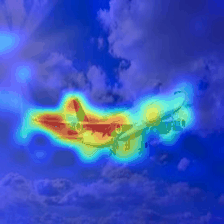

In [ ]:
from IPython.display import Image, display

# Display the GIF we just saved
gif_path = "/content/grad_attention_discard.gif"
display(Image(filename=gif_path))


In [ ]:
import os
import torch
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

def gradient_rollout_grid(model, img_paths, transform, imagenet_classes,
                          head_fusion="max", cols=2, grid_size=None, discard=0.0):
    """
    Compute and visualize gradient attention rollout masks for multiple images in a grid.

    Args:
        model (torch.nn.Module): Vision Transformer model
        img_paths (list[str]): Paths to input images
        transform (torchvision.transforms): Transformations to apply to input images
        imagenet_classes (list[str]): ImageNet class names
        head_fusion (str): How to fuse attention heads ('max', 'mean', 'min')
        cols (int): Number of columns in grid
        grid_size (int or None): Number of patches along width/height; if None, inferred from mask
        discard (float): Fraction of lowest attention values to discard (0.0–0.9)

    Returns:
        None (displays a matplotlib grid)
    """

    imgs = [Image.open(p).convert("RGB") for p in img_paths]
    results = []

    for img_path, img in zip(img_paths, imgs):
        # Prepare input
        x = transform(img).unsqueeze(0)
        x.requires_grad = True

        torch.set_grad_enabled(True)

        # Clear hooks
        attentions_maps_grad.clear()
        attentions_grad.clear()

        # Forward pass
        out = model(x)

        # Predicted index + class name
        pred_idx = out.argmax().item()
        predicted_class_name = imagenet_classes[pred_idx]

        # Backward pass
        score = out[0, pred_idx]
        model.zero_grad()
        score.backward()

        # Compute gradient attention rollout mask with discard
        mask_vec = gradient_attention_rollout(
            att_maps=attentions_maps_grad,
            att_grads=attentions_grad,
            head_fusion=head_fusion,
            discard=discard
        )

        # Extract “actual class” from filename (after first underscore, remove extension)
        file_name = os.path.basename(img_path)
        after_first_underscore = file_name.split("_", 1)[1] if "_" in file_name else file_name
        no_ext = after_first_underscore.split(".")[0]
        actual_class = no_ext.replace("_", " ")

        results.append((img, mask_vec, actual_class, predicted_class_name))

    # ---- Visualization Grid ----
    n = len(results)
    if grid_size is None:
        grid_size = int(np.sqrt(results[0][1].shape[0]))

    rows = (n + cols - 1) // cols
    plt.figure(figsize=(cols * 4, rows * 4))

    for i, (img, mask_vec, actual_class, predicted_class_name) in enumerate(results):
        plt.subplot(rows, cols, i + 1)

        # Normalize + reshape mask
        mask_vec = mask_vec / (mask_vec.max() + 1e-12)
        mask_grid = mask_vec.reshape(grid_size, grid_size)
        mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
        mask_np = np.array(mask_img)

        # Overlay
        plt.imshow(img)
        plt.imshow(mask_np, cmap='jet', alpha=0.6)
        plt.axis('off')

        # Title with actual vs predicted
        plt.title(f"Actual Class: {actual_class}\nPredicted Class: {predicted_class_name}", fontsize=9)

    plt.tight_layout()
    plt.show()



This function runs **Gradient Attention Rollout** on multiple images and displays all their heatmaps in a grid. For each image, it loads and preprocesses it, performs a forward and backward pass to collect attention maps and gradients, computes a class-specific rollout mask, and overlays this heatmap on the original image. Each subplot shows the image with its relevance heatmap plus its **actual class (from filename)** and **predicted class**. The result is a clean grid comparing how the ViT attends to different images.




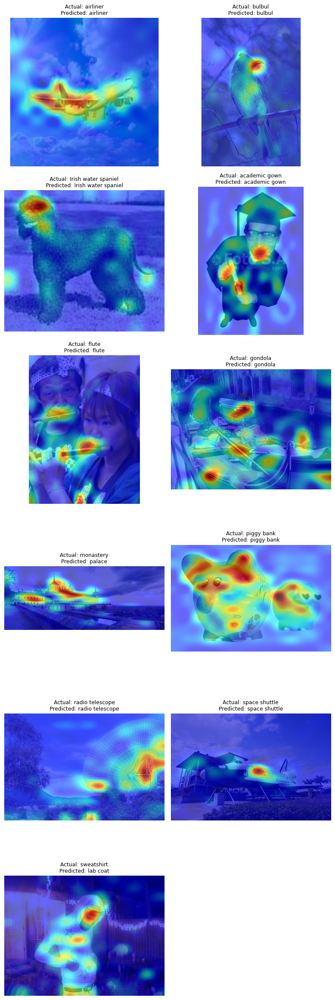

In [ ]:
import glob
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# --- Parameters ---
fusion = "max"          # 'max', 'mean', or 'min'
discard = 0.9           # Fraction of lowest attention values to discard
grid_cols = 2           # Number of columns in grid

# --- Load images ---
img_paths = sorted(glob.glob("/content/drive/MyDrive/ADA project/*"))
imgs = [Image.open(p).convert("RGB") for p in img_paths]

# --- Compute attention rollout for each image ---
rollouts = []

for img_path, img in zip(img_paths, imgs):
    # Transform the image for the model
    x = transform(img).unsqueeze(0)
    x.requires_grad = True

    # Enable gradients
    torch.set_grad_enabled(True)

    # Clear previous hooks
    attentions_maps_grad.clear()
    attentions_grad.clear()

    # Forward pass
    out = model(x)

    # Predicted class
    pred_idx = out.argmax().item()
    predicted_class_name = imagenet_classes[pred_idx]

    # Backward pass
    score = out[0, pred_idx]
    model.zero_grad()
    score.backward()

    # Gradient attention rollout mask with discard
    mask_vec = gradient_attention_rollout(
        att_maps=attentions_maps_grad,
        att_grads=attentions_grad,
        head_fusion=fusion,
        discard=discard
    )

    # Extract actual class from filename
    file_name = os.path.basename(img_path)
    after_first_underscore = file_name.split("_", 1)[1] if "_" in file_name else file_name
    no_ext = after_first_underscore.split(".")[0]
    actual_class = no_ext.replace("_", " ")

    rollouts.append((img, mask_vec, actual_class, predicted_class_name))

# --- Plot grid ---
n = len(rollouts)
grid_size = int(np.sqrt(rollouts[0][1].shape[0]))
rows = (n + grid_cols - 1) // grid_cols
plt.figure(figsize=(grid_cols * 4, rows * 4))

for i, (img, mask_vec, actual_class, predicted_class_name) in enumerate(rollouts):
    plt.subplot(rows, grid_cols, i + 1)

    # Normalize and reshape mask
    mask_vec = mask_vec / (mask_vec.max() + 1e-12)
    mask_grid = mask_vec.reshape(grid_size, grid_size)
    mask_img = Image.fromarray(mask_grid).resize(img.size, Image.Resampling.LANCZOS)
    mask_np = np.array(mask_img)

    # Overlay
    plt.imshow(img)
    plt.imshow(mask_np, cmap='jet', alpha=0.6)
    plt.axis('off')
    plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class_name}", fontsize=9)

plt.tight_layout()
plt.show()


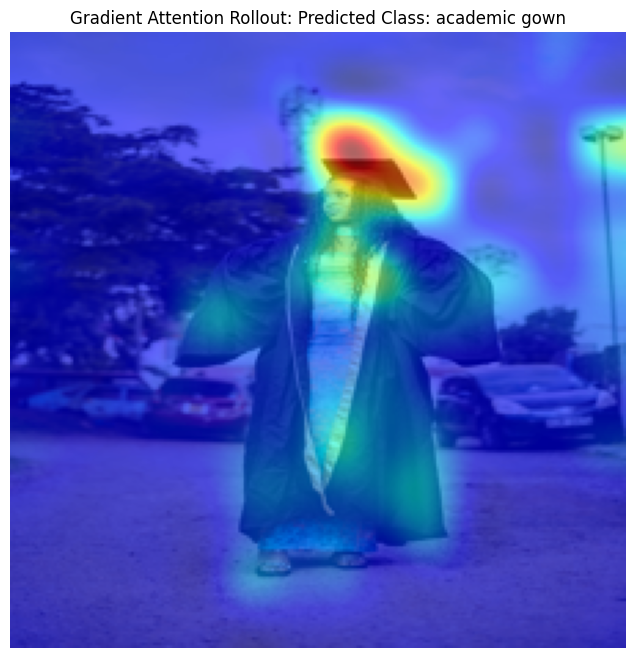

In [ ]:
from PIL import Image
import torch
from torchvision import transforms

# --- Parameters ---
image_path = '/content/drive/MyDrive/black_woman_academic_gown.jpg'
model_size = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
discard_ratio = 0.9  # You can change this

# --- Load image ---
try:
    img = Image.open(image_path).convert('RGB').resize((model_size, model_size))
except FileNotFoundError:
    print(f"ERROR: Image file '{image_path}' not found.")
    raise

# --- Transform and prepare input ---
transform = transforms.Compose([
    transforms.Resize((model_size, model_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

input_tensor = transform(img).unsqueeze(0)
input_tensor.requires_grad = True  # Enable gradients

# --- Clear previous hooks ---
attentions_maps_grad.clear()
attentions_grad.clear()

# --- Forward pass ---
model.train()  # Enable gradients
output = model(input_tensor)

# --- Predicted class ---
pred_idx = output.argmax(dim=-1).item()
predicted_class_name = imagenet_classes[pred_idx]

# --- Backward pass for the predicted class ---
score = output[0, pred_idx]
model.zero_grad()
score.backward()

# --- Compute gradient attention rollout mask ---
mask_vec = gradient_attention_rollout(
    att_maps=attentions_maps_grad,
    att_grads=attentions_grad,
    head_fusion="max",
    discard=discard_ratio
)

# --- Overlay the mask using existing function ---
visualize_mask_vector(
    mask_vec,
    img,
    title=f"Gradient Attention Rollout: Predicted Class: {predicted_class_name}",
    grid_size=14,
    alpha=0.6
)


In [ ]:
# Import libraries
import os
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Folder containing images
image_folder = "/content/drive/MyDrive/ADA project"
image_paths = [
    os.path.join(image_folder, f)
    for f in os.listdir(image_folder)
    if f.lower().endswith((".jpeg", ".png", ".jpg"))
]

# Grid size for rollout visualization
GRID_SIZE = 14


In [ ]:
# Load Mask-RCNN model for foreground segmentation
mask_model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")
mask_model.eval()

def compute_foreground_mask(img, threshold=0.5):
    """
    Compute binary foreground mask using Mask-RCNN.

    Args:
        img (PIL.Image): Input image
        threshold (float): Confidence threshold to consider a pixel as foreground

    Returns:
        np.ndarray: Binary mask (HxW) where 1=foreground, 0=background
    """
    transform = transforms.ToTensor()
    x = transform(img).unsqueeze(0)

    with torch.no_grad():
        out = mask_model(x)

    masks = out[0]["masks"]  # [N,1,H,W]
    if len(masks) == 0:
        return np.zeros((img.height, img.width), dtype=np.uint8)

    combined_mask = (masks > threshold).any(dim=0).squeeze().cpu().numpy().astype(np.uint8)
    return combined_mask


In [ ]:
def compute_attention_fractions_from_grad(grad_vector, mask_img, grid_size=GRID_SIZE):
    """
    Compute fraction of gradient attention in foreground vs background.

    Args:
        grad_vector (np.ndarray): Gradient rollout vector of length grid_size^2
        mask_img (np.ndarray): Binary foreground mask (HxW)
        grid_size (int): Number of patches along width/height

    Returns:
        fg_frac (float): Fraction of attention on foreground
        bg_frac (float): Fraction of attention on background
    """
    grad_vector = grad_vector / (grad_vector.sum() + 1e-12)

    mask_grid = np.array(
        Image.fromarray(mask_img).resize((grid_size, grid_size), Image.Resampling.NEAREST)
    )

    fg_frac = grad_vector[mask_grid.flatten() == 1].sum()
    bg_frac = grad_vector[mask_grid.flatten() == 0].sum()
    return fg_frac, bg_frac


In [ ]:
results = []

for img_path in image_paths:
    img = Image.open(img_path).convert("RGB")

    # Compute gradient attention rollout (hooks & gradients should be set)
    grad_mask_vector = gradient_attention_rollout(
        attentions_maps_grad,
        attentions_grad,
        head_fusion="max"
    )

    # Compute foreground mask
    fg_mask = compute_foreground_mask(img)

    # Compute foreground/background fractions
    fg_frac, bg_frac = compute_attention_fractions_from_grad(grad_mask_vector, fg_mask)

    results.append({
        "image": os.path.basename(img_path),
        "foreground_frac": fg_frac,
        "background_frac": bg_frac
    })

df_results = pd.DataFrame(results)
df_results


,image,foreground_frac,background_frac
0,airliner.png,0.143207,0.856793
1,n03781244_monastery.jpeg,0.002682,0.997318
2,n02102973_Irish_water_spaniel.jpeg,0.702905,0.297095
3,n04044716_radio_telescope.jpeg,0.448094,0.551906
4,n03447447_gondola.jpeg,0.496550,0.503450
5,n04266014_space_shuttle.jpeg,0.261458,0.738542
6,n03372029_flute.jpeg,0.927210,0.072790
7,n01560419_bulbul.jpeg,0.290288,0.709712
8,n04370456_sweatshirt.jpeg,0.672043,0.327957
9,n03935335_piggy_bank.jpeg,0.573470,0.426530


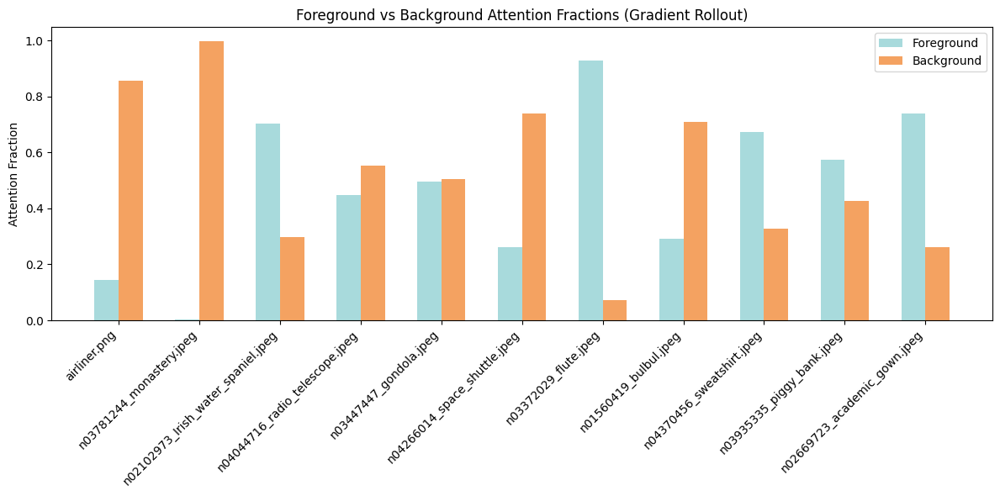

In [ ]:
plt.figure(figsize=(12,6))
x = np.arange(len(df_results))

plt.bar(
    x - 0.15,
    df_results["foreground_frac"],
    width=0.3,
    label="Foreground",
    color="#a8dadc"
)
plt.bar(
    x + 0.15,
    df_results["background_frac"],
    width=0.3,
    label="Background",
    color="#f4a261"
)

plt.xticks(x, df_results["image"], rotation=45, ha='right')
plt.ylabel("Attention Fraction")
plt.title("Foreground vs Background Attention Fractions (Gradient Rollout)")
plt.legend()
plt.tight_layout()
plt.show()




#  **Comparison: Gradient Attention Rollout vs Max Fusion Rollout (Foreground vs Background Attention)**


### **1. Max Fusion Rollout**

* Uses **only raw attention weights** (not class-specific).
* Background attention is often **higher**, even dominating in some images.
* Foreground attention varies widely and sometimes drops very low (e.g., *Irish water spaniel*, *monastery*).
* Easily distracted by **background features**, lighting, or context.

**Takeaway:**
- Not class-specific
- Often overestimates background importance
- Less reliable for judging ViT decision-making


### **2. Gradient Attention Rollout**

* Uses **both attention and gradients**, giving **class-specific** importance.
* Foreground attention is **generally higher** and better aligned with the actual object.
* Background attention is **reduced**, especially where background clutter exists.
* Produces more **balanced and meaningful** FG/BG splits (e.g., flutes, academic gown, piggy bank).
* More sensitive to **true discriminative regions** of the object.

**Takeaway:**
- Better separation between object and background
- More faithful attribution
- More stable across diverse images


### **Overall Comparison**

* **Gradient Attention Rollout** gives **cleaner, more object-focused attention**, because gradients make it class-specific.
* **Max Fusion Rollout** spreads attention widely and often highlights background, since it uses only raw attention weights.
* **Gradient Rollout consistently produces higher foreground fractions**, meaning it better reflects the model’s true reasoning.


**Gradient Rollout isolates class-relevant regions, while Max Fusion Rollout shows general attention that often includes background noise.**

---


In [ ]:
from PIL import Image
import torch
from torchvision import transforms

# Image path
image_path = "/content/drive/MyDrive/cat_dog.jpg"
img = Image.open(image_path).convert("RGB")

# Transform for model input
model_size = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

transform = transforms.Compose([
    transforms.Resize((model_size, model_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

input_tensor = transform(img).unsqueeze(0)
input_tensor.requires_grad = True


In [ ]:
def grad_rollout_for_class(model, input_tensor, target_idx, head_fusion="max", discard=0.0):
    """
    Compute gradient attention rollout mask for a given target class.

    Args:
        model: Vision Transformer model
        input_tensor: input image tensor (1,C,H,W)
        target_idx: index of the target class (ImageNet index)
        head_fusion: how to fuse heads ('max', 'mean', 'min')
        discard: fraction of lowest attention values to discard (0-1)

    Returns:
        np.ndarray: Gradient rollout mask for the target class
    """
    # Clear previous hooks
    attentions_maps_grad.clear()
    attentions_grad.clear()

    # Forward pass
    model.train()  # ensure gradients
    output = model(input_tensor)

    # Backward pass for target class
    model.zero_grad()
    score = output[0, target_idx]
    score.backward()

    # Compute gradient attention rollout
    mask_vec = gradient_attention_rollout(
        att_maps=attentions_maps_grad,
        att_grads=attentions_grad,
        head_fusion=head_fusion,
        discard=discard
    )

    return mask_vec


In [ ]:
import requests

# Load ImageNet class names
IMAGENET_URL = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = requests.get(IMAGENET_URL).text.splitlines()

# Find indices for dog and cat
dog_idx = [i for i, name in enumerate(imagenet_classes) if "dog" in name.lower()]
cat_idx = [i for i, name in enumerate(imagenet_classes) if "cat" in name.lower()]

# Pick first matching index
dog_idx = dog_idx[0]
cat_idx = cat_idx[0]

print(f"Dog class index: {dog_idx}, Cat class index: {cat_idx}")


Dog class index: 153, Cat class index: 143


In [ ]:
# Dog mask
dog_input = transform(img).unsqueeze(0)
dog_input.requires_grad = True
dog_mask = grad_rollout_for_class(model, dog_input, target_idx=207, head_fusion="max")

# Cat mask
cat_input = transform(img).unsqueeze(0)
cat_input.requires_grad = True
cat_mask = grad_rollout_for_class(model, cat_input, target_idx=281, head_fusion="max")


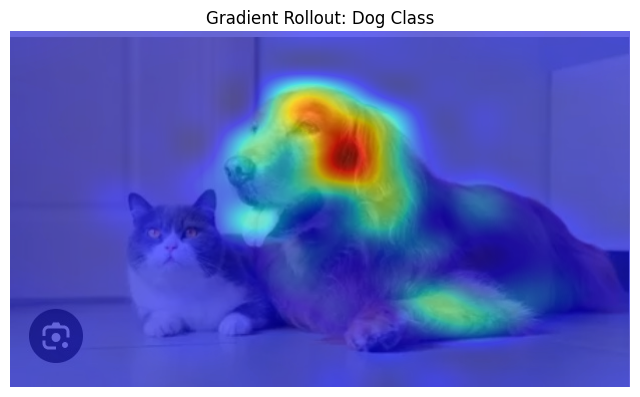

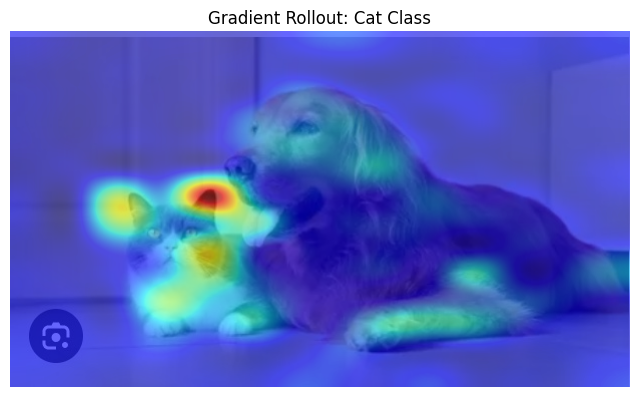

In [ ]:
# Reuse your visualize_mask_vector function
visualize_mask_vector(dog_mask, img, title="Gradient Rollout: Dog Class", grid_size=14, alpha=0.6)
visualize_mask_vector(cat_mask, img, title="Gradient Rollout: Cat Class", grid_size=14, alpha=0.6)


In [ ]:
import requests
import json
from typing import List, Optional

# --- 1. Load the ImageNet Class Labels ---
# We use a reliable JSON file from the web that contains the mapping
# for the 1000 classes in the order used by PyTorch pre-trained models.
IMAGENET_CLASSES_URL = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"

def load_imagenet_labels(url: str = IMAGENET_CLASSES_URL) -> List[str]:
    """
    Downloads the ImageNet index-to-label mapping and returns it as a list.
    The list index (0-999) corresponds directly to the model's output index.
    """
    try:
        # Fetch the JSON content
        response = requests.get(url)
        response.raise_for_status() # Raise HTTPError for bad responses (4xx or 5xx)

        # The JSON format is { "0": ["n01440764", "tench"], "1": [...] }
        # We need to extract the human-readable name, which is the second element
        # of the inner list, and keep the order based on the string keys "0" to "999".
        data = json.loads(response.text)

        # Create a list where the index is the class ID (0-999) and the value is the name
        # The keys need to be sorted numerically, as JSON keys are strings
        labels = [data[str(i)][1] for i in range(1000)]

        return labels

    except requests.exceptions.RequestException as e:
        print(f"Error downloading ImageNet labels: {e}")
        return []
    except json.JSONDecodeError as e:
        print(f"Error decoding JSON: {e}")
        return []
    except KeyError as e:
        print(f"Error processing JSON keys (missing index): {e}")
        return []

# Load the labels once when the script starts
IMAGENET_LABELS = load_imagenet_labels()

# --- 2. Function to Lookup the Label ---

def get_imagenet_label(index: int) -> Optional[str]:
    """
    Looks up the human-readable label for a given ImageNet index.

    Args:
        index (int): The classification index (0 to 999) from the model's output.

    Returns:
        str or None: The class label string or None if the index is invalid.
    """
    if not IMAGENET_LABELS:
        return "ERROR: Labels not loaded. Check internet connection or URL."

    if 0 <= index < len(IMAGENET_LABELS):
        return IMAGENET_LABELS[index]
    else:
        return f"Index {index} is out of the valid range (0 to 999)."

# --- 3. Example Usage ---

print("\n--- ImageNet Label Lookup ---")

# Test with a common index (e.g., Tiger Cat)
test_index_1 = 546
label_1 = get_imagenet_label(test_index_1)
print(f"Index {test_index_1}: {label_1}")

# Test with the first index (e.g., Tench)
test_index_2 = 889
label_2 = get_imagenet_label(test_index_2)
print(f"Index {test_index_2}: {label_2}")

# Test with the last index (e.g., Toilet Tissue)
test_index_3 = 440
label_3 = get_imagenet_label(test_index_3)
print(f"Index {test_index_3}: {label_3}")

# Test with an invalid index
test_index_4 = 1000
label_4 = get_imagenet_label(test_index_4)
print(f"Index {test_index_4}: {label_4}")


--- ImageNet Label Lookup ---
Index 546: electric_guitar
Index 889: violin
Index 440: beer_bottle
Index 1000: Index 1000 is out of the valid range (0 to 999).


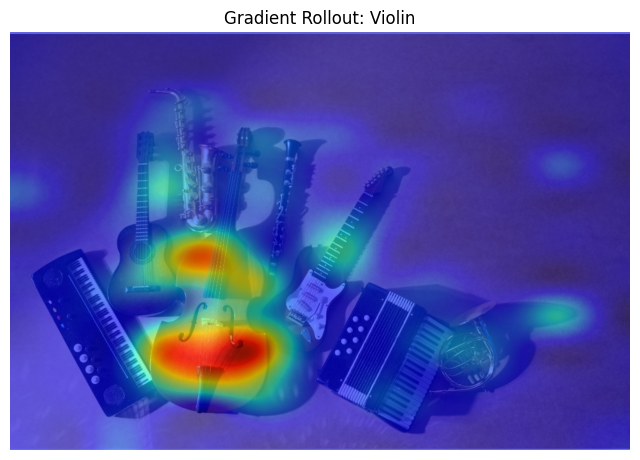

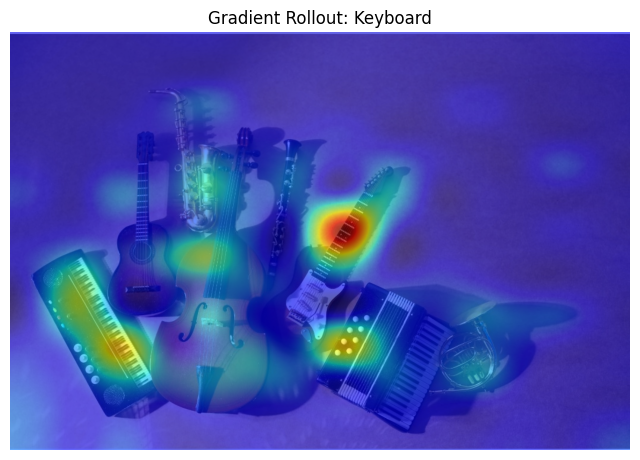

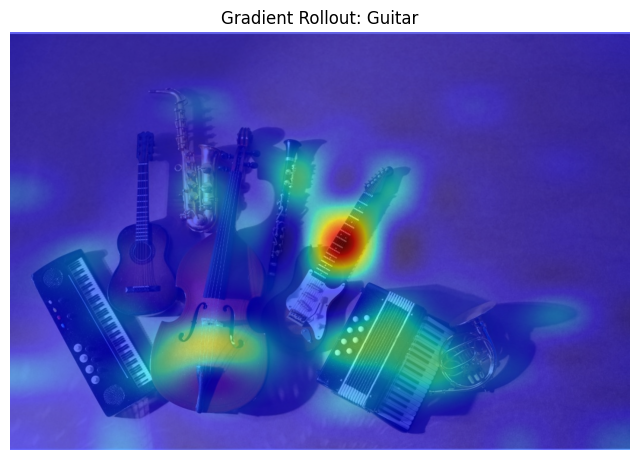

In [ ]:
from PIL import Image
import torch
from torchvision import transforms
import requests

# --- 1. Image & Transform Setup ---
image_path = "/content/drive/MyDrive/Musical_instruments.jpg"
img = Image.open(image_path).convert("RGB")

model_size = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

transform = transforms.Compose([
    transforms.Resize((model_size, model_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

input_tensor = transform(img).unsqueeze(0)
input_tensor.requires_grad = True

# --- 2. Load ImageNet Classes ---
IMAGENET_URL = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = requests.get(IMAGENET_URL).text.splitlines()

# --- 3. Gradient Rollout Function ---
def grad_rollout_for_class(model, input_tensor, target_idx, head_fusion="max", discard=0.0):
    attentions_maps_grad.clear()
    attentions_grad.clear()

    model.train()
    output = model(input_tensor)

    model.zero_grad()
    score = output[0, target_idx]
    score.backward()

    mask_vec = gradient_attention_rollout(
        att_maps=attentions_maps_grad,
        att_grads=attentions_grad,
        head_fusion=head_fusion,
        discard=discard
    )

    return mask_vec

# --- 4. Provide a dictionary of {index: label} for the classes you want ---
class_labels = {
    889: "Violin",
    579: "Keyboard",
    546: "Guitar"
}

# --- 5. Compute masks and visualize with proper labels ---
for idx, label in class_labels.items():
    x = transform(img).unsqueeze(0)
    x.requires_grad = True
    mask_vec = grad_rollout_for_class(model, x, target_idx=idx, head_fusion="max")
    visualize_mask_vector(mask_vec, img,
                          title=f"Gradient Rollout: {label}", grid_size=14, alpha=0.6)




#  **Attention Rollout vs Gradient Attention Rollout**

---

## **1. Attention Rollout (Vanilla Rollout)**

**Idea:** Multiply the attention matrices across transformer layers to track how information flows from the CLS token to the input patches.

### What it uses?

* Only the **raw attention weights** from each layer
* Head fusion (mean, max, or discard low attention)

### What it tells?

* “Which patches does the model *attend to* overall?”

### Limitations

* Not **class-specific**
* Attention weights alone do NOT measure importance
* Attention may not correlate with model decisions

---

## **2. Gradient Attention Rollout**

**Idea:** Combine attention weights with **gradients of the target class**, then perform rollout.

### What it uses?

* Attention matrices
* **Gradients of the class score** w.r.t attention or tokens

### What it tells?

* “Which patches were **important for this specific class prediction**?”

### Advantages

* **Class-specific explanations**
* Weights attention by contribution → more faithful attribution
* Produces sharper and more meaningful heatmaps

---

## **Summary**

**Attention Rollout** → Tracks *where the model looks* (not class-specific).
**Gradient Attention Rollout** → Tracks *which patches influenced the predicted class* (class-specific + more accurate).

---





# **Comparison: Gradient Attention Rollout vs Attention Rollout**

### **Attention Rollout (Max Fusion)**

* Uses **only the raw attention weights** from the transformer.
* Highlights **where the model attends overall**, regardless of class.
* Tends to give **smooth, broad heatmaps**.
* Often lights up the **general outline of the person** or object.
* Not class-specific → it shows attention but **not true importance**.

 In the result:

* The heatmap highlights the **whole gown**, arms, and body.
* Shows global attention flow but not what specifically drove the prediction.

---

###  **Gradient Attention Rollout**

* Multiplies attention with **gradients of the target class**.
* Shows **which patches truly contributed** to predicting “academic gown.”
* More **class-specific**, **sharper**, and **more faithful**.
* Highlights **key discriminative regions** the model used.

 In the result:

* Strong activation on the **graduation cap** and **upper torso**.
* Highlights the **academic gown shape** more precisely.
* Ignores background cars and sky almost entirely.



#  **Conclusion**

“Attention Rollout shows global attention flow, while Gradient Attention Rollout shows class-specific importance — explaining *why* the ViT predicted ‘academic gown.’”

---
---